In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
image_gray = np.load('outputs/image_gray.npy')

layer_one_output = np.load('outputs/layer_one_output.npy')
layer_two_output = np.load('outputs/layer_two_output.npy')
layer_three_output = np.load('outputs/layer_three_output.npy')

pooling_output = np.load('outputs/pooling_output.npy')

In [3]:
def centered_ft2d(image):
    ft = np.fft.fft2(image)
    ft = np.fft.fftshift(ft)
    return ft

def centered_ift2d(image):
    ift = np.fft.ifftshift(image)
    ift = np.fft.ifft2(ift)
    return ift

In [4]:
def distance(point1, point2):
    x1, y1 = point1
    x2, y2 = point2
    return np.sqrt((x1-x2)**2 + (y1-y2)**2)

def GaussianFilter(image_shape, D0, filter='low'):
    P, Q = image_shape[:2]
    center = (P/2, Q/2)

    H = np.zeros((P, Q))

    for i in range(P):
        for j in range(Q):
            D = distance((i, j), center)

            if filter == 'low':
                H[i, j] = np.exp(-(D**2)/(2*(D0**2)))
            elif filter == 'high':
                H[i, j] = 1 - np.exp(-(D**2)/(2*(D0**2)))
    return H


def IdealFilter(image_shape, D0, filter='low'):
    P, Q = image_shape[:2]
    center = (P/2, Q/2)

    H = np.zeros((P, Q))
    if filter == "high":
        H = np.ones((P, Q))

    for i in range(P):
        for j in range(Q):
            D = distance((i, j), center)

            if filter == 'low' and D < D0:
                H[i, j] = 1
            elif filter == 'high' and D < D0:
                H[i, j] = 0
    return H

In [5]:
def plot_image(image, channels_num, title):
    fig, axes = plt.subplots(channels_num, 4, figsize=(20, channels_num * 5))

    for i in range(channels_num):
        axes[i, 0].imshow(image[:,:,i], cmap='gray')
        axes[i, 0].set_title('{}, Channel {}'.format(title , i+1))

        ft_image = centered_ft2d(image[:,:,i])
        axes[i, 1].imshow(np.log(np.abs(ft_image)), cmap='gray')
        axes[i, 1].set_title('{}, Channel {}, Magnitude'.format(title, i+1))

        axes[i, 2].imshow(np.angle(ft_image), cmap='gray')
        axes[i, 2].set_title('{}, Channel {}, Phase Angle'.format(title, i+1))

        ift_image = centered_ift2d(ft_image)
        axes[i, 3].imshow(np.abs(ift_image), cmap='gray')
        axes[i, 3].set_title('{}, Channel {}, processed'.format(title, i+1))

    plt.show()


def plot_image_filter(image, channels_num, title):
    if len(image.shape) == 2:
        image = np.expand_dims(image, axis=-1)

    fig, axes = plt.subplots(channels_num * 2, 4, figsize=(20, channels_num * 10))

    for i in range(channels_num):
        axes[0+2*i, 0].imshow(image[:,:,i], cmap='gray')
        axes[0+2*i, 0].set_title('{}, Channel {}'.format(title, i+1))

        ft_image = centered_ft2d(image[:,:,i])
        lowPass = IdealFilter(ft_image.shape, 30, filter='low')
        lowPass_image = ft_image * lowPass

        axes[0+2*i, 1].imshow(np.log(1+np.abs(lowPass_image)), cmap='gray')
        axes[0+2*i, 1].set_title('LowPass, Magnitude')

        axes[0+2*i, 2].imshow(np.angle(lowPass_image), cmap='gray')
        axes[0+2*i, 2].set_title('LowPass, Phase Angle')

        ift_image = centered_ift2d(lowPass_image)
        axes[0+2*i, 3].imshow(np.abs(ift_image), cmap='gray')
        axes[0+2*i, 3].set_title('LowPass, processed')


        axes[1+2*i, 0].imshow(image[:,:,i], cmap='gray')
        axes[1+2*i, 0].set_title('{}, Channel {}'.format(title, i+1))

        ft_image = centered_ft2d(image[:,:,i])
        highPass = IdealFilter(ft_image.shape, 30, filter='high')
        highPass_image = ft_image * highPass

        axes[1+2*i, 1].imshow(np.log(1+np.abs(highPass_image)), cmap='gray')
        axes[1+2*i, 1].set_title('HighPass, Magnitude')

        axes[1+2*i, 2].imshow(np.angle(highPass_image), cmap='gray')
        axes[1+2*i, 2].set_title('HighPass, Phase Angle')

        ift_image = centered_ift2d(highPass_image)
        axes[1+2*i, 3].imshow(np.abs(ift_image), cmap='gray')
        axes[1+2*i, 3].set_title('HighPass, processed')
        
    plt.show()

#### <font color='yellow'>Original image FFT</font>

Text(0.5, 1.0, 'Original Image, processed')

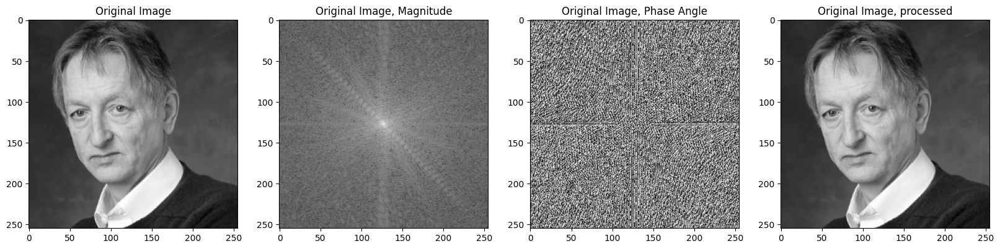

In [6]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Image')

ft_image_gray = centered_ft2d(image_gray)
axes[1].imshow(np.log(np.abs(ft_image_gray)), cmap='gray')
axes[1].set_title('Original Image, Magnitude')

axes[2].imshow(np.angle(ft_image_gray), cmap='gray')
axes[2].set_title('Original Image, Phase Angle')

ift_image_gray = centered_ift2d(ft_image_gray)
axes[3].imshow(np.abs(ift_image_gray), cmap='gray')
axes[3].set_title('Original Image, processed')

<style>
*{
   font-family: "b nazanin";
   color: white;
   font-size: 14;
   direction: rtl;
   align: right;
}
</style>
&emsp;&emsp; به طور کلی فرکانس های بالا به علت شدت زیاد در تغییر رنگ پیکسل ها مانند لبه ها ظاهر میشوند و فرکانس های پایین به علت شدت کم در تغییر رنگ پیکسل ها.   
&emsp;&emsp;برای مثال در تصویر بالا، لبه ای که یقه سفید و لباس مشکی ایجاد کرده است باعث بوجود آمدن خطی مورب که به سوی فرکانس های بالا میرود شده.

#### <font color='yellow'>Layer 1 FFT</font>

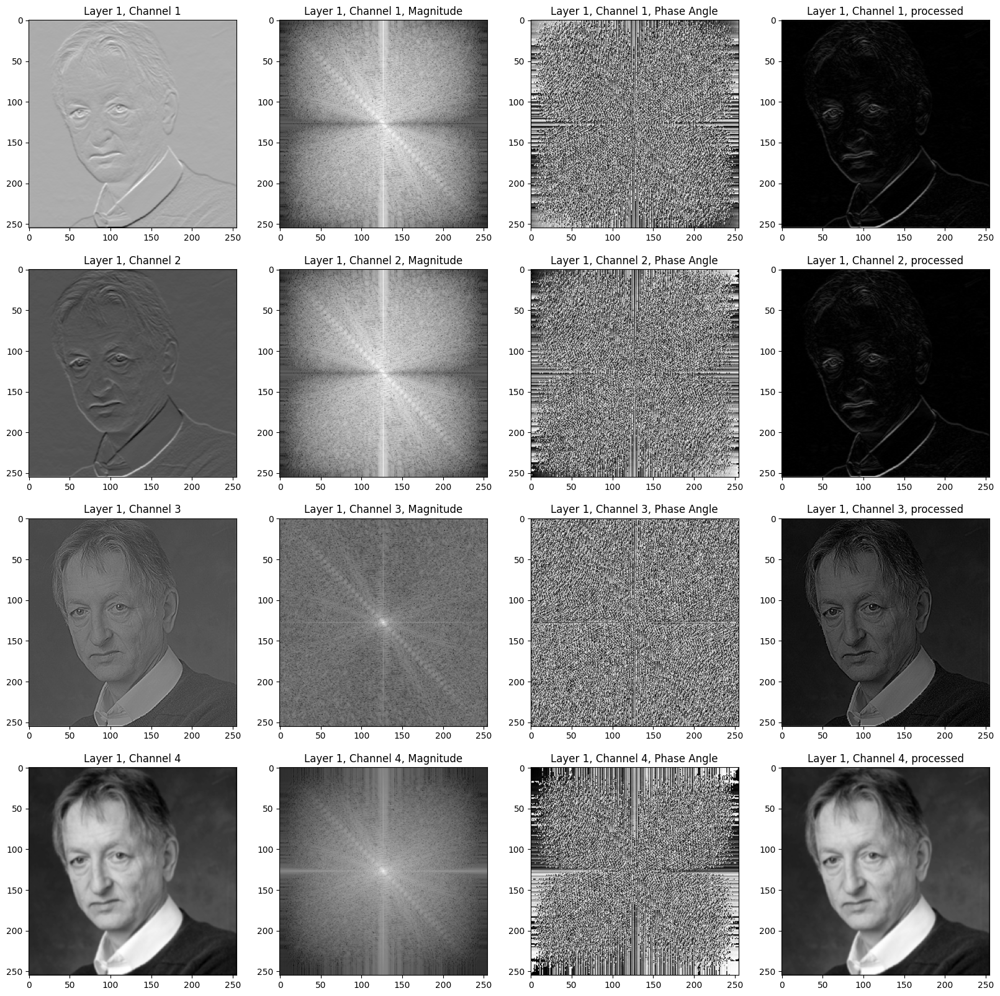

In [7]:
plot_image(layer_one_output, 4, 'Layer 1')

<style>
*{
   font-family: "b nazanin";
   color: white;
   font-size: 14;
   direction: rtl;
   align: right;
}
</style>
&emsp;&emsp;در خروجی اول اثر تشدید لبه ها در حوزه فرکانس هم مشاهده میشود. فرکانس های بالا سفید تر شدند.  
&emsp;&emsp;در خروجی چهارم بر اثر smoothing تصویر، فرکانس های بالا کمتر شدند و فرکانس های پایین بیشتر شدند.

#### <font color='yellow'>Layer 2 FFT</font>

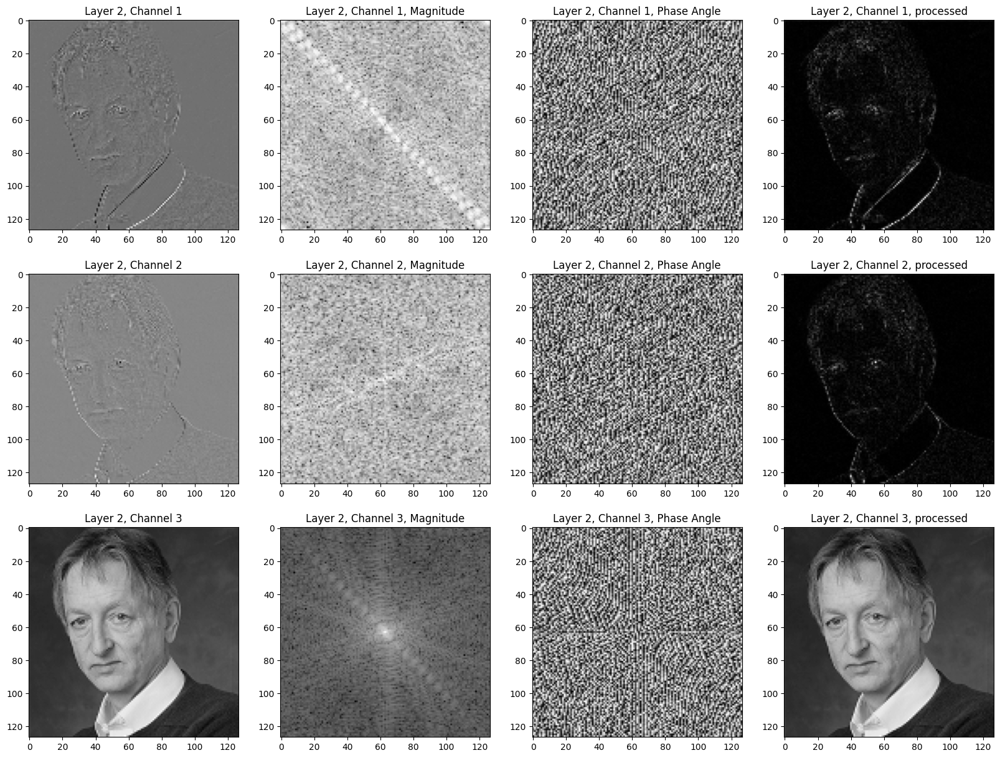

In [8]:
plot_image(layer_two_output, 3, 'Layer 2')

#### <font color='yellow'>Layer 3 FFT</font>

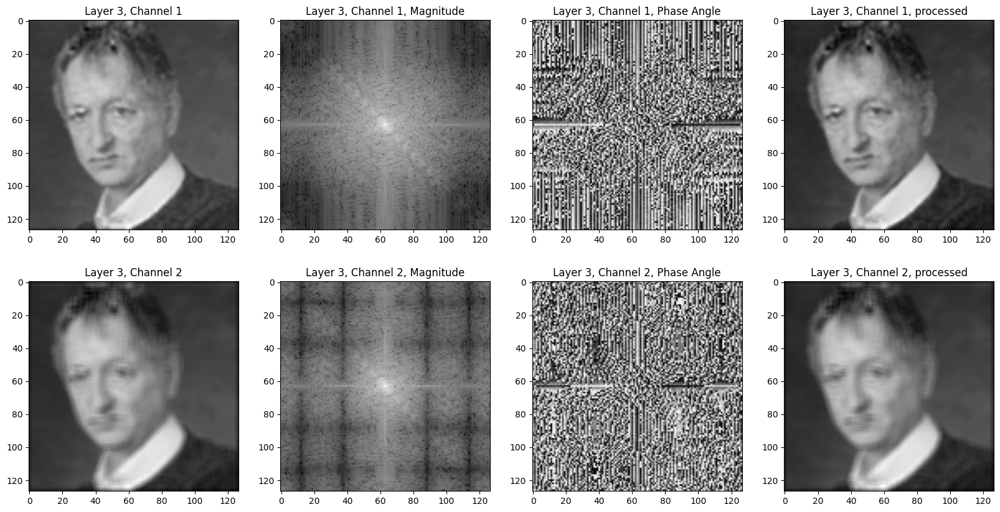

In [9]:
plot_image(layer_three_output, 2, 'Layer 3')

#### <font color='yellow'>MaxPooling FFT</font>

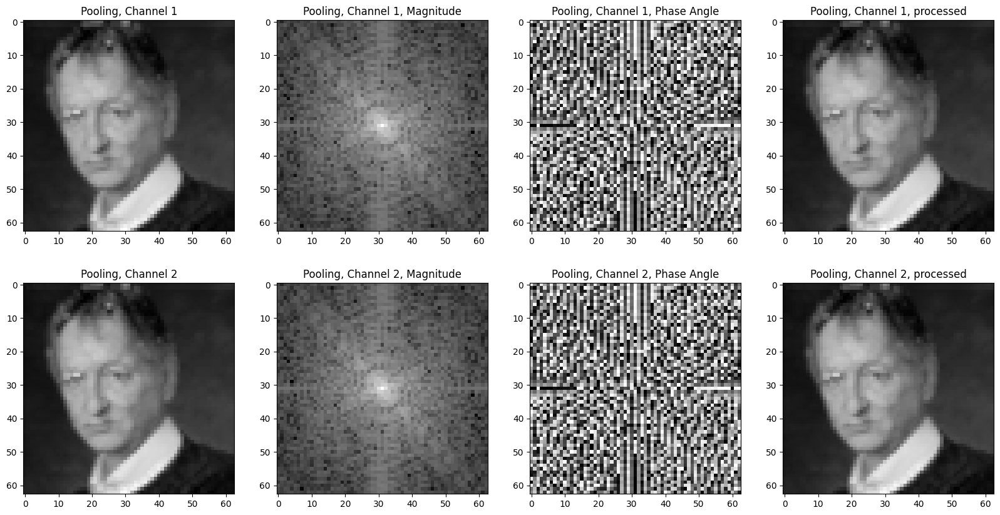

In [10]:
plot_image(pooling_output, 2, 'Pooling')

#### <font color='yellow'>LowPass and HighPass Filters</font>

Text(0.5, 1.0, 'Gaussian HighPass Filter')

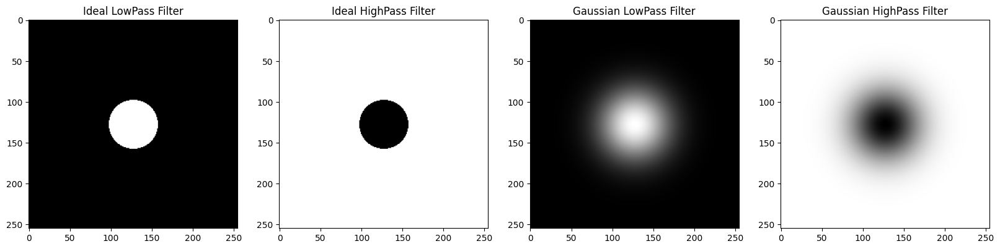

In [11]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

IdealLowPass = IdealFilter(image_gray.shape, 30, filter='low')
IdealHighPass = IdealFilter(image_gray.shape, 30, filter='high')

axes[0].imshow(np.abs(IdealLowPass), cmap='gray')
axes[0].set_title('Ideal LowPass Filter')

axes[1].imshow(np.abs(IdealHighPass), cmap='gray')
axes[1].set_title('Ideal HighPass Filter')

GaussianLowPass = GaussianFilter(image_gray.shape, 30, filter='low')
GaussianHighPass = GaussianFilter(image_gray.shape, 30, filter='high')

axes[2].imshow(np.abs(GaussianLowPass), cmap='gray')
axes[2].set_title('Gaussian LowPass Filter')

axes[3].imshow(np.abs(GaussianHighPass), cmap='gray')
axes[3].set_title('Gaussian HighPass Filter')

<style>
*{
   font-family: "b nazanin";
   color: white;
   font-size: 14;
   direction: rtl;
   align: right;
}
</style>
&emsp;&emsp;به طور کلی فیلتر های بالا گذر با حذف یا کمرنگ کردن فرکانس های پایین باعث میشوند تا لبه های تصویر بیشتر به نمایش گذاشته شوند.  
&emsp;&emsp;و فیلتر های پایین گذر با حذف کردن فرکانس های بالا باعث میشوند تا لبه های تصویر محو شود و تصویر smooth تر شود.

#### <font color='yellow'>Original image LowPass and HighPass Filters result</font>

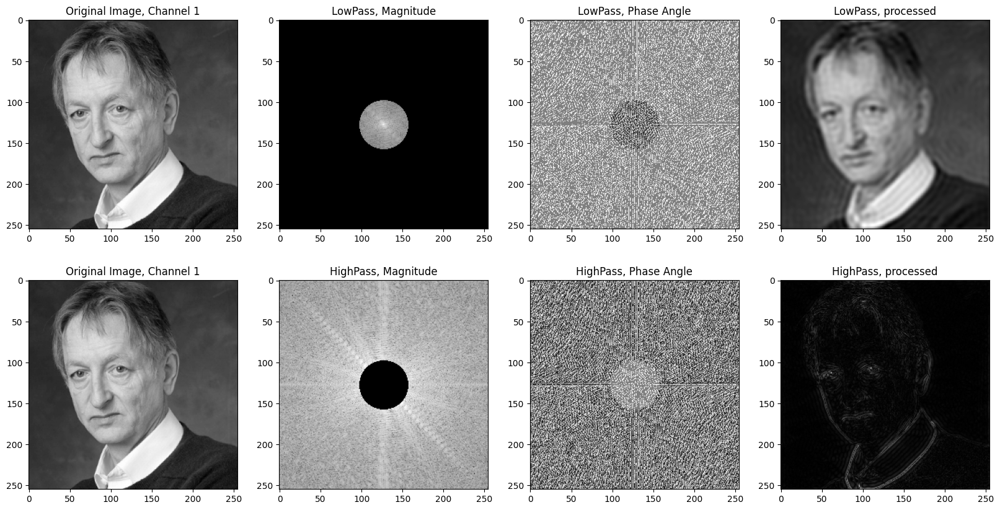

In [12]:
plot_image_filter(image_gray, 1, 'Original Image')

#### <font color='yellow'>Layer 1 LowPass and HighPass Filters result</font>

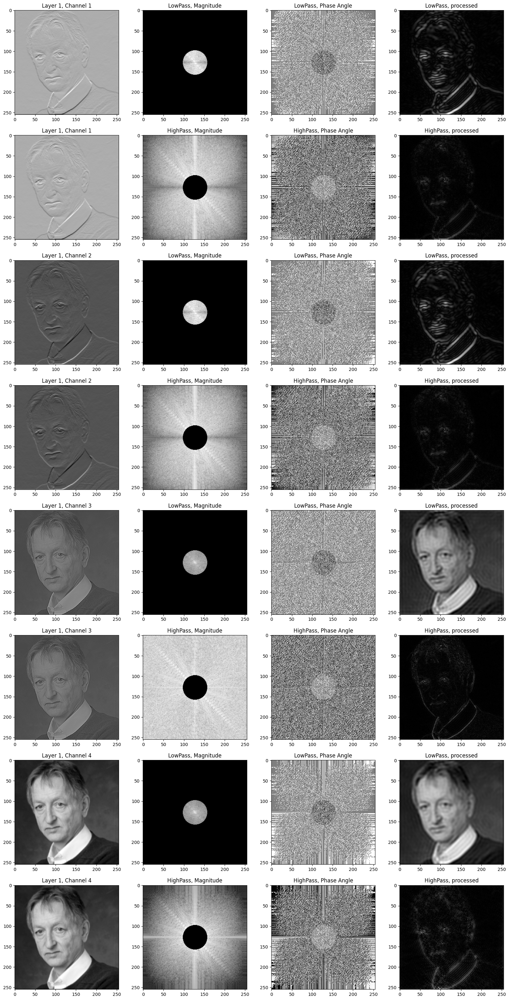

In [13]:
plot_image_filter(layer_one_output ,4 , 'Layer 1')

#### <font color='yellow'>Layer 2 LowPass and HighPass Filters result</font>

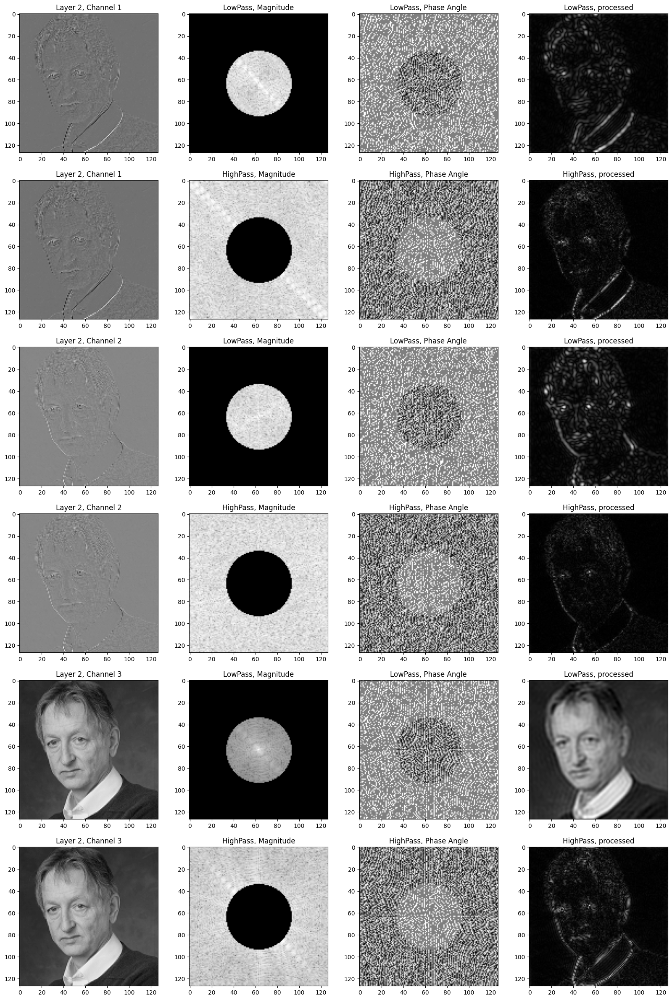

In [14]:
plot_image_filter(layer_two_output, 3, 'Layer 2')

#### <font color='yellow'>Layer 3 LowPass and HighPass Filters result</font>

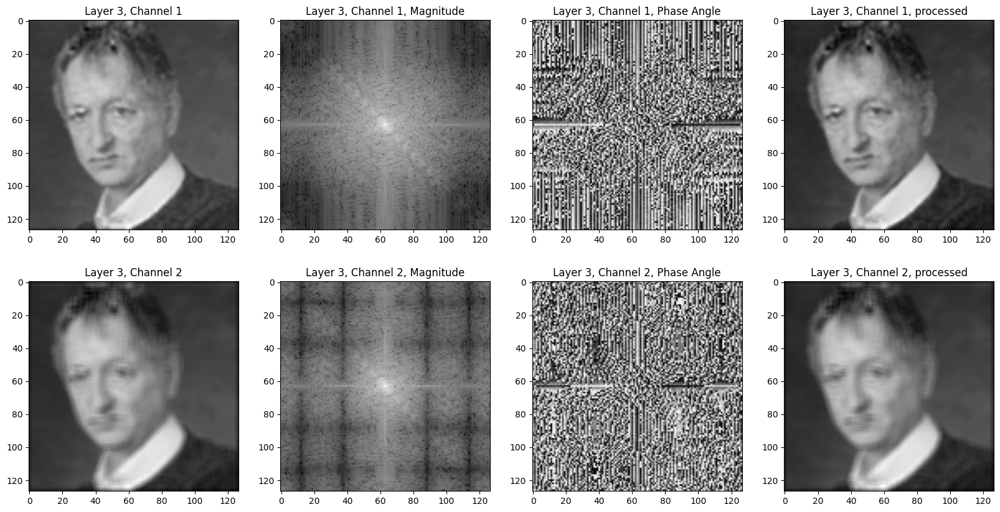

In [15]:
plot_image(layer_three_output, 2, 'Layer 3')

#### <font color='yellow'>MaxPooling LowPass and HighPass Filters result</font>

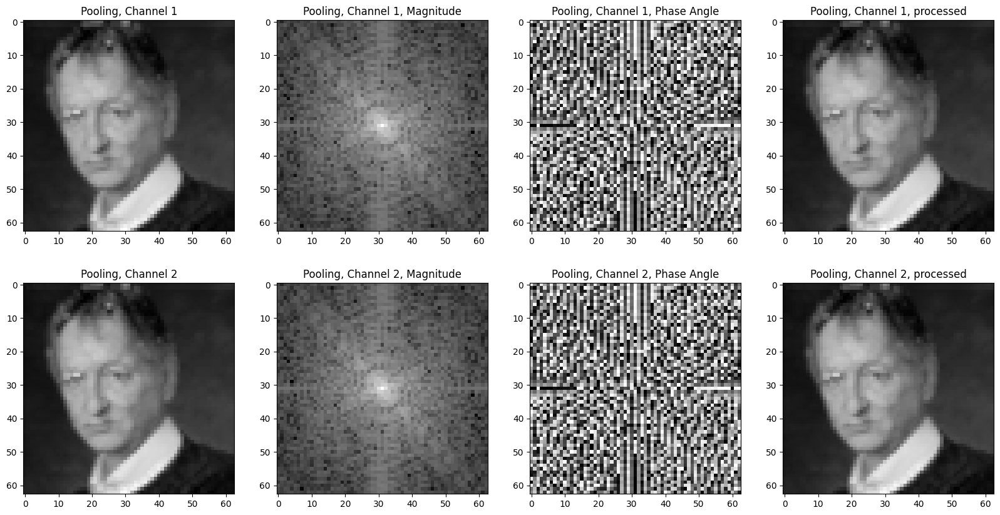

In [16]:
plot_image(pooling_output, 2, 'Pooling')